# Import packages

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>")) #Set scaling for the jupyter notebook cell width - make them bigger

/tmp/ipykernel_1379/3983057131.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [3]:
#General packages
from IPython.display import clear_output #import of a single funtcion
import sys #system related packages
import os #better path and file handling
import pickle #saving and loading objects

#Tables, numbers etc
import pandas as pd #tables
import numpy as np #arrays
import scipy #sciency functions
from sklearn import mixture #For gaussian mixture model

#Plotting packages
import matplotlib.pyplot as plt #Main plotting
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D
import seaborn as sbn #nicer plots

#RNA-seq analysis
import scanpy as sc #Main package for scRNA-seq analysis
import scanpy.external as sce #some more functions for scanpy
import bbknn #batch correction

from natsort import natsorted, ns

root = '/mnt/g' if 'mnt' in os.getcwd() else 'G:' #root path depending on which environment I use

#Import some custom helper functions for plotting
path_skin_scripts = '/mnt/g/My Drive/Python/Projects'.format(root)
sys.path.append(path_skin_scripts)
from Skin_scripts import *

In [4]:
cell_cycle_genes_path = '{}/My Drive/Python/Projects/regev_lab_cell_cycle_genes.txt'.format(root)

cell_cycle_genes = [x.strip().title() for x in open(cell_cycle_genes_path)]

# Separate dataset for S-phase or G2M-phase associated genes
s_genes = [x for x in cell_cycle_genes[:43]]
g2m_genes = [x for x in cell_cycle_genes[43:]]

# Read and combine datasets

In [4]:
path = '{}/My Drive/MKA/Papers/Greco/Sara and Nur/Loom files'.format(root)
files = [f for f in os.listdir(path) if 'NonKC' in f]

In [5]:
adata = sc.concat([sc.read_loom(os.path.join(path, f)) for f in files], )


KeyboardInterrupt



In [6]:
sample = {'HMU': 'HMU',
          'HM5U': 'HMU', 
          'HM12U': 'HMU',
          'HM5W': 'HMW',
          'HM12W': 'HMW', 
          'HMW': 'HMW', 
          'HF12U': 'HFU', 
          'HFU': 'HFU',
          'HF2U': 'HFU', 
          'HF2W': 'HFW', 
          'HF12W': 'HFW', 
          'HF13W': 'HFW', 
          'WTM3U': 'WTMU', 
          'WTM11U': 'WTMU', 
          'WTM13U': 'WTMU',
          'WTMW3W': 'WTMW', 
          'WTMW11W': 'WTMW', 
          'WTMW13W': 'WTMW', 
          'WTF6U': 'WTFU', 
          'WTF8U': 'WTFU', 
          'WTFU': 'WTFU', 
          'WTFW': 'WTFW',
          'WTF8W': 'WTFW', 
          'WTF6W': 'WTFW'}
adata.obs['batch'] = adata.obs['orig.ident'].apply(lambda x: sample[x])

In [7]:
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype(str)
adata.var['ribo'] = adata.var_names.str.startswith('Rps') | adata.var_names.str.startswith('Rpl')
adata.var['mito'] = adata.var_names.str.startswith('mt')
adata.var['hemo'] = adata.var_names.str.startswith('Hba') | adata.var_names.str.startswith('Hbb')

In [8]:
adata

AnnData object with n_obs × n_vars = 24010 × 14995
    obs: 'Immune21', 'Infundibulum1', 'RBC1', 'RNA_snn_res.0.1', 'integrated_snn_res.0.1', 'leiden', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_hemo', 'log1p_total_counts_mito', 'log1p_total_counts_ribo', 'nCount_RNA', 'nFeature_RNA', 'n_genes_by_counts', 'orig.ident', 'pct_counts_hemo', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_50_genes', 'pct_counts_mito', 'pct_counts_ribo', 'percent.mt', 'seurat_clusters', 'total_counts', 'total_counts_hemo', 'total_counts_mito', 'total_counts_ribo', 'batch'
    var: 'ribo', 'mito', 'hemo'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'

In [9]:
sc.pp.calculate_qc_metrics(adata, inplace = True, qc_vars = ['ribo','mito','hemo'])

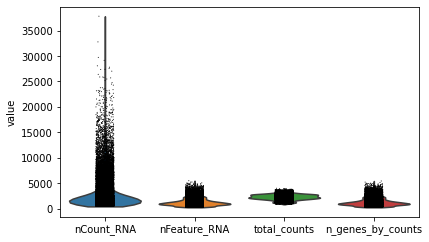

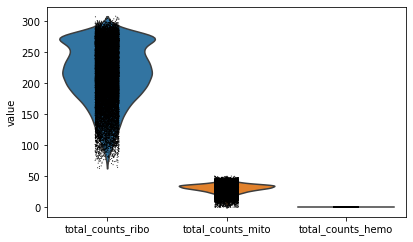

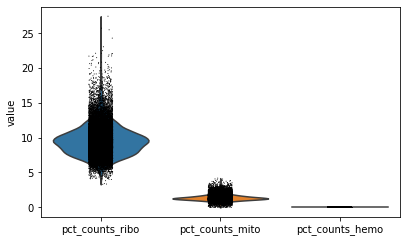

In [10]:
sc.pl.violin(adata, keys = ['nCount_RNA','nFeature_RNA', 'total_counts', 'n_genes_by_counts'])
sc.pl.violin(adata, keys = ['total_counts_ribo','total_counts_mito', 'total_counts_hemo'])
sc.pl.violin(adata, keys = ['pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

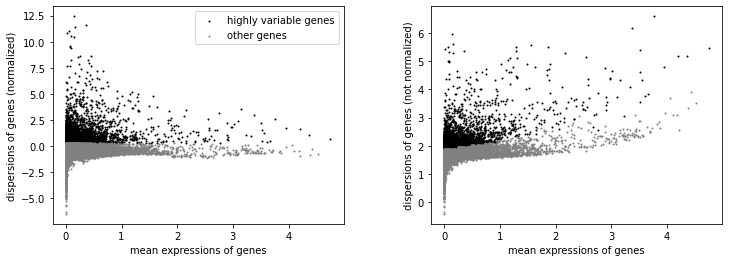

In [11]:
sc.pp.highly_variable_genes(adata, n_top_genes = 4000)
sc.pl.highly_variable_genes(adata)

In [12]:
adata.raw = adata

In [13]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_genes(adata, min_counts=10)

/home/karlan/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/karlan/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [14]:
adata.obs_names_make_unique()

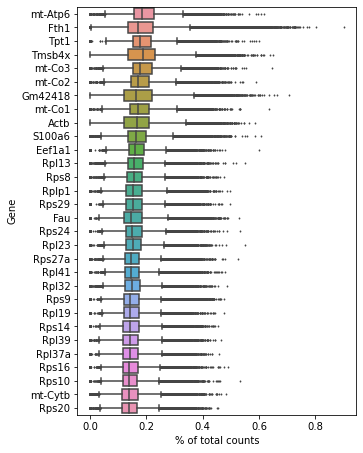

In [15]:
sc.pl.highest_expr_genes(adata)

In [16]:
sc.pp.scale(adata)

In [17]:
sc.pp.pca(adata)
bbknn.bbknn(adata, batch_key='orig.ident')
sc.tl.umap(adata, spread = 1)

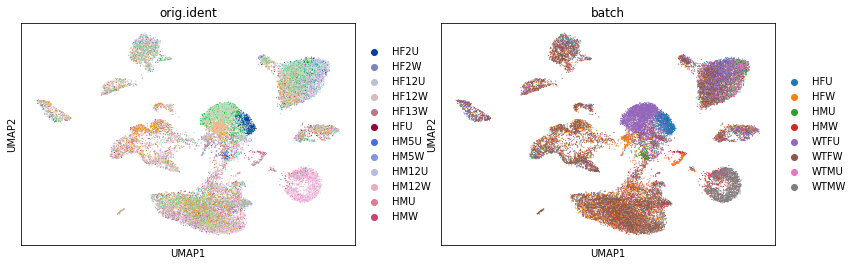

In [18]:
sc.pl.umap(adata, color = ['orig.ident', 'batch'])

In [19]:
sc.tl.leiden(adata, resolution = 0.3)

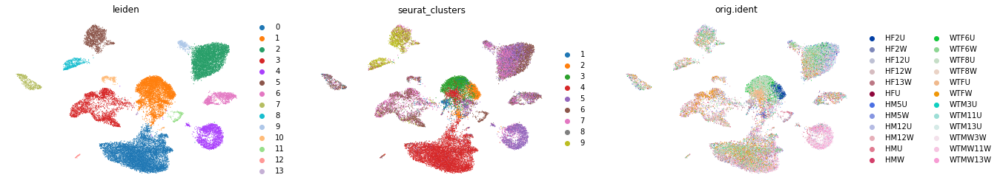

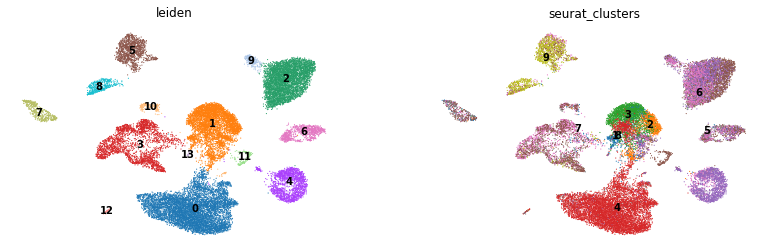

In [20]:
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters', 'orig.ident'], frameon = False)
sc.pl.umap(adata, color = ['leiden', 'seurat_clusters'], frameon = False, legend_loc = 'on data')

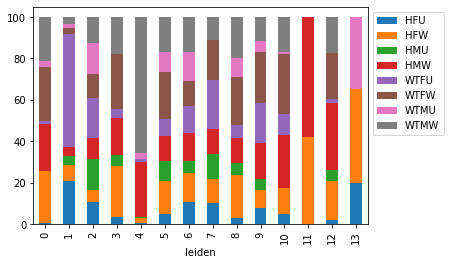

In [21]:
samp_dist = pd.DataFrame(adata.obs.groupby('leiden')['batch'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

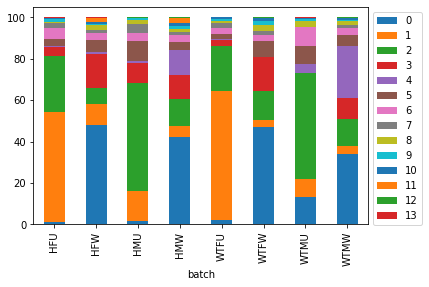

In [22]:
samp_dist = pd.DataFrame(adata.obs.groupby('batch')['leiden'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

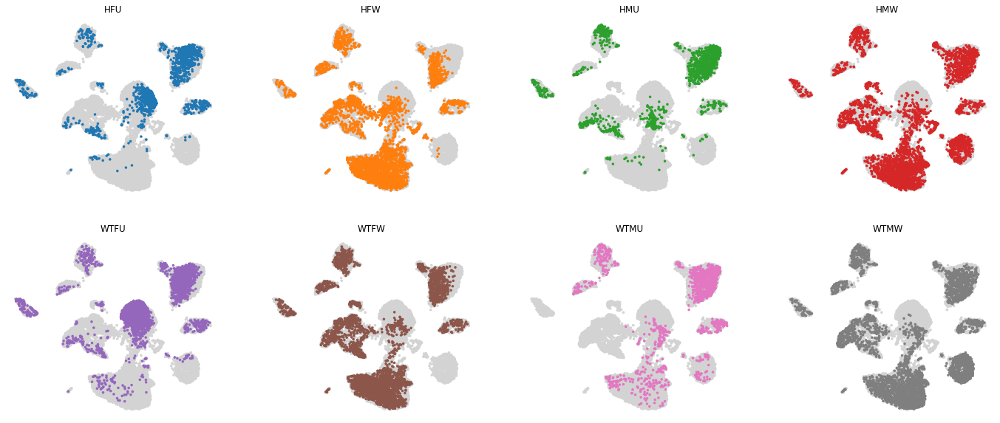

In [23]:
groups = adata.obs['batch'].unique()
ncols = 4
fig, axes = initialize_subplots(len(groups), ncols = ncols, figsize_multiplier=(6,5))

for ix, g in enumerate(sorted(groups)):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(adata, color = 'batch', ax = ax, show = False, frameon = False, groups = [g], legend_loc = 'on_data', title = g, s = 50)
clear_output()

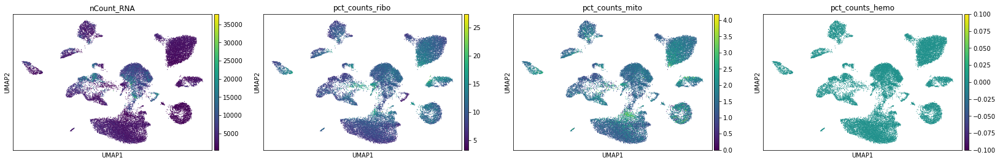

In [24]:
sc.pl.umap(adata, color = ['nCount_RNA', 'pct_counts_ribo','pct_counts_mito', 'pct_counts_hemo'])

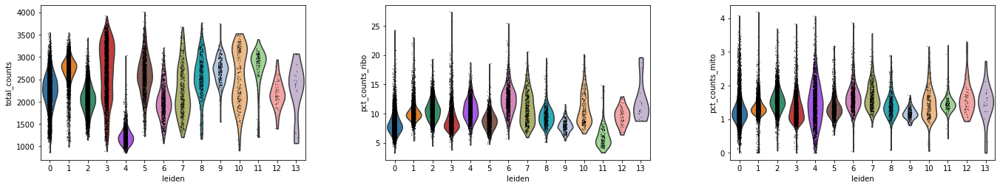

In [25]:
sc.pl.violin(adata, keys = ['total_counts','pct_counts_ribo', 'pct_counts_mito'], groupby='leiden')

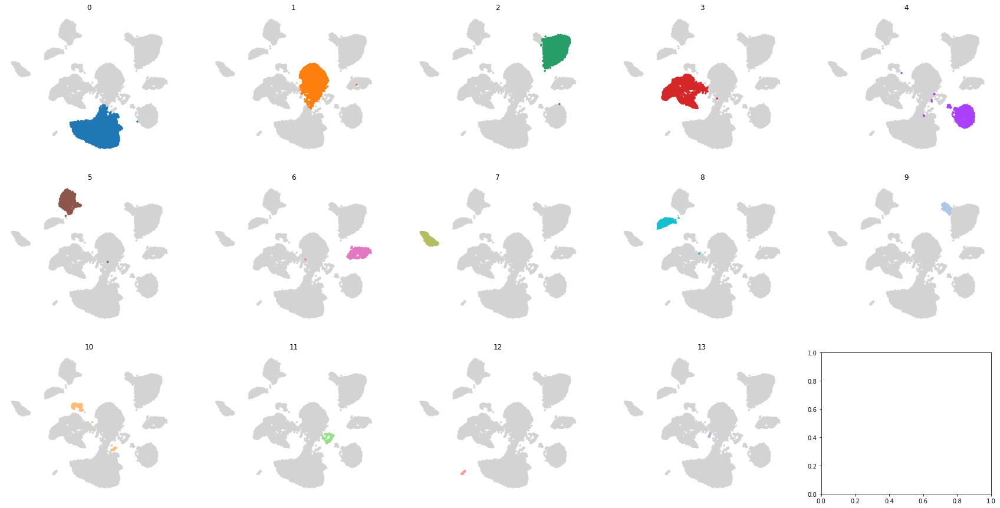

In [26]:
groups = adata.obs['leiden'].unique()
ncols = 5
fig, axes = initialize_subplots(len(groups), ncols = ncols, figsize_multiplier=(6,5))

for ix, g in enumerate(sorted(groups, key = lambda x: int(x))):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(adata, color = 'leiden', ax = ax, show = False, frameon = False, groups = [g], legend_loc = 'on_data', title = g, s = 50)
clear_output()

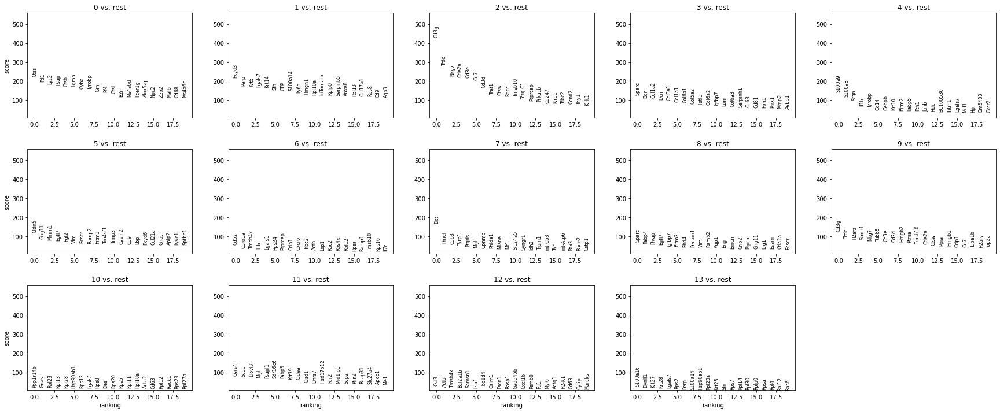

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Ctss,Fxyd3,Cd3g,Sparc,S100a9,Cldn5,Cd52,Dct,Sparc,Cd3g,Ppp1r14b,Cers4,Cst3,S100a16
1,Ftl1,Perp,Trdc,Bgn,S100a8,Gng11,Coro1a,Pmel,Fabp4,Trdc,Gnas,Scd1,Actb,Dynll1
2,Lyz2,Krt5,Nkg7,Col1a2,Srgn,Mmrn1,Tmsb4x,Cd63,Plvap,H2afz,Rpl23,Elovl3,Tmsb4x,Krt27
3,Psap,Lgals7,Ctla2a,Dcn,Il1b,Egfl7,Ltb,Tyrp1,Egfl7,Stmn1,Rpl13,Mgll,Bcl2a1b,Krt28
4,Ctsb,Krt14,Cd3e,Col3a1,Tyrobp,Fgl2,Lgals1,Ptgds,Igfbp7,Nkg7,Rpl28,Psapl1,Samsn1,Lgals7
5,Lgmn,Sfn,Cd7,Col1a1,Cd14,Vim,Rps24,Mgll,Ifitm3,Tubb5,Hsp90ab1,Sdr16c6,Lsp1,Rps2
6,Cyba,GFP,Cd3d,Col6a1,Cebpb,Ecscr,Ptprcap,Gpnmb,Ehd4,Cd3e,Rps13,Fabp5,Tbc1d4,Perp
7,Tyrobp,S100a14,Trat1,Col5a2,Krt10,Ramp2,Crip1,Phlda1,Pecam1,Cd3d,Lgals1,Krt79,Calm1,S100a14
8,Grn,Ly6d,Ctsw,Fstl1,Ifitm2,Ifitm3,Cxcr6,Mlana,Vim,Hmgb2,Rps8,Cidea,Fscn1,Hsp90ab1
9,Pf4,Hmgn1,Rgcc,Col6a2,Fabp5,Tm4sf1,Trbc2,Mt1,Ramp2,Ptma,Des,Cisd1,Basp1,Rpl23a


In [27]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata, ncols = 5)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

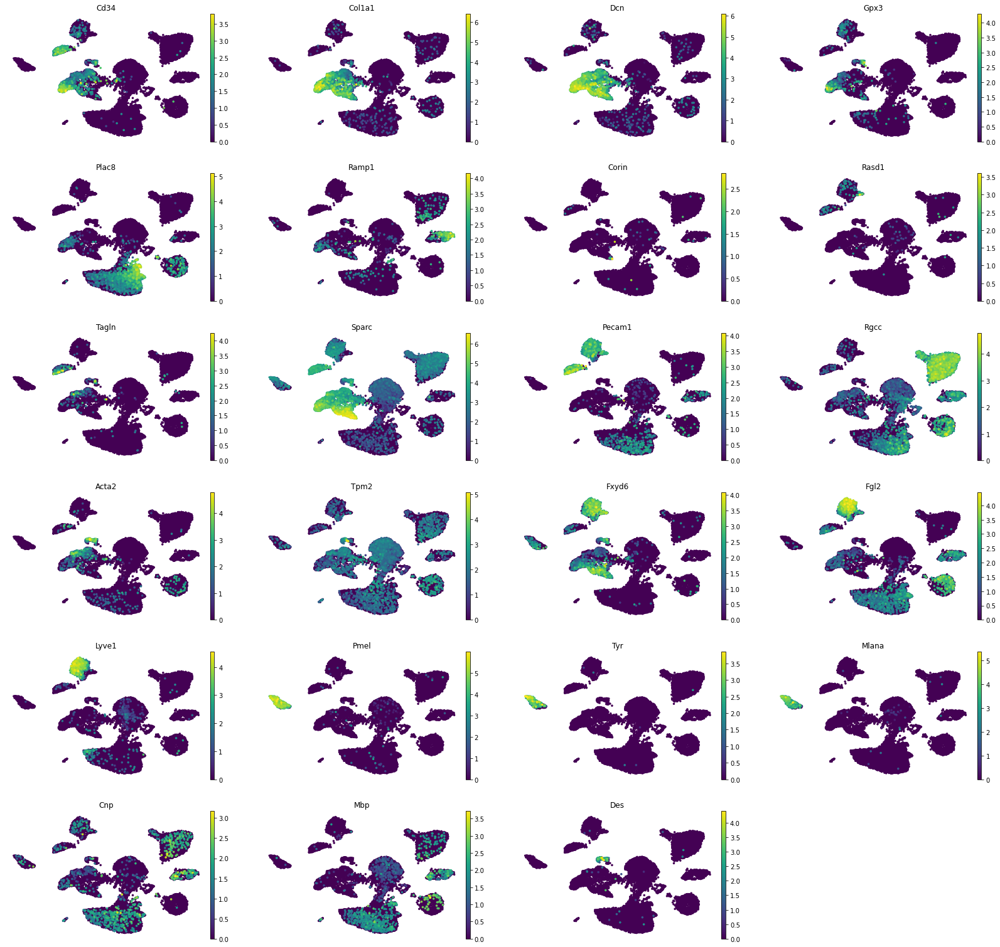

In [28]:
genes = ['Cd34', 'Col1a1', 'Dcn', 'Gpx3', 'Plac8', 'Ramp1', 'Corin', 'Rasd1', 'Tagln', 'Sparc', 'Pecam1', 'Rgcc', 'Acta2', 'Tpm2', 'Myl9', 'Fxyd6', 'Fgl2', 'Lyve1', 'Pmel', 'Tyr', 'Mlana', 'Cnp', 'Mbp', 'Mpz', 'Des', 'Acta1']
genes = [g for g in genes if g in adata.var_names]
sc.pl.umap(adata, color = genes, legend_loc='on data', frameon = False, s = 50)

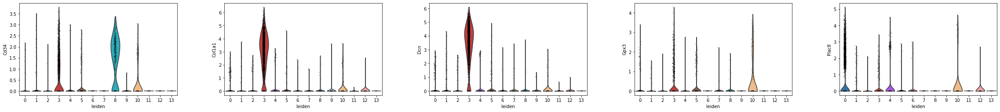

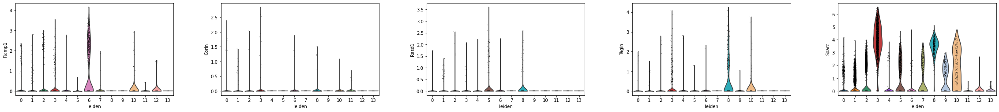

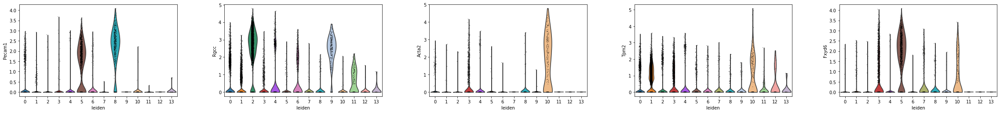

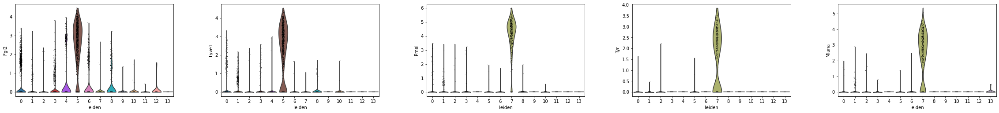

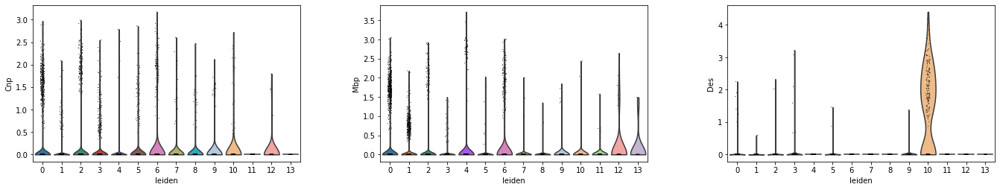

In [29]:
for i in range(0,len(genes), 5):
    sc.pl.violin(adata, keys = genes[i: i+5], groupby = 'leiden') 

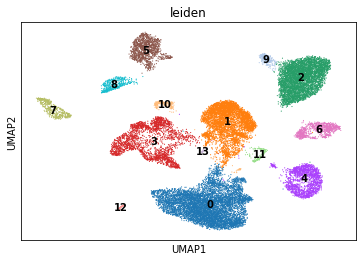

In [30]:
sc.pl.umap(adata, color = 'leiden', legend_loc = 'on data')

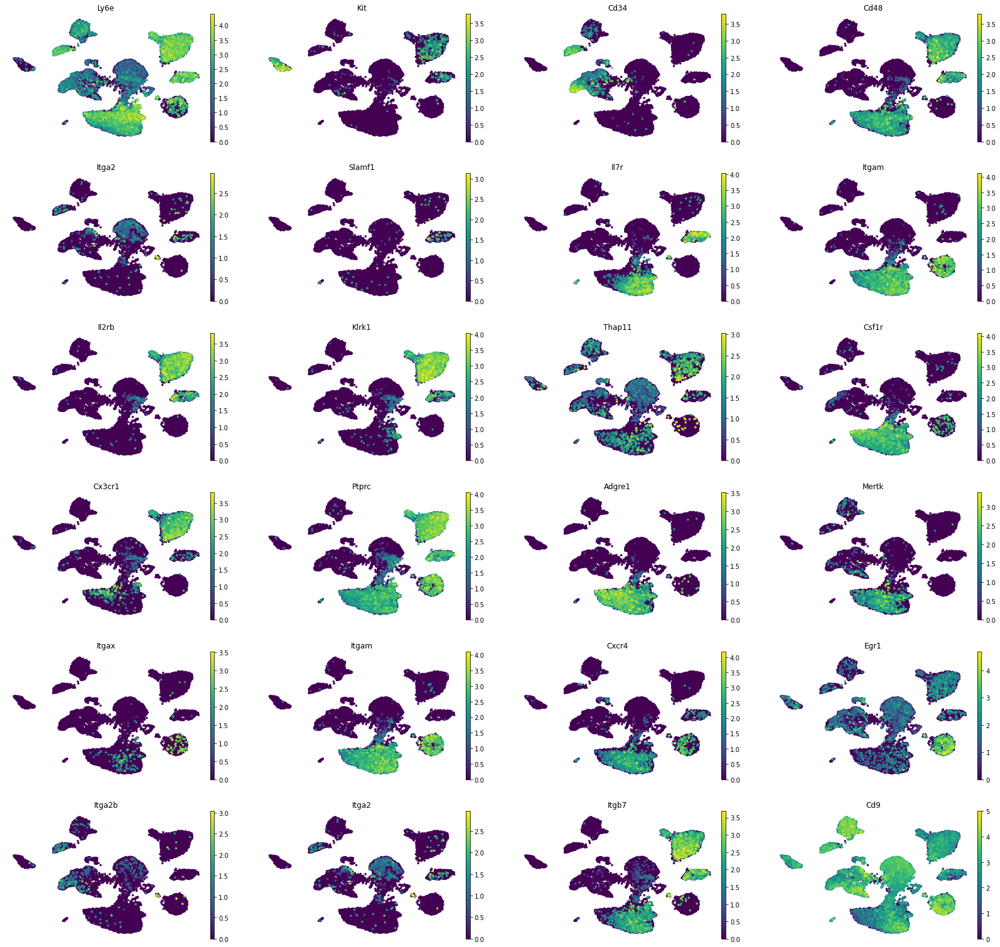

In [31]:
genes = ['Cd34', 'Ptprc', 'Cd3', 'Cd56', 'Cd49', 'NKp46', 'Cd19', 'Cd14', 'Cd11b', 'Cd68', 'Cd163', 'Cd11c', 'Hla-dr', 'Cd16', 'Cd18', 'Cd32', 'Cd44', 'Cd55', 'Cd125', 'Cd193', 'F4/80', 'Sigle-8', 'Cd22', 'Cd123', 'Cd32', 'Cd33', 'Cd117', 'Cd203c', 'Fceri', 'B220']
genes = ['Ly6e', 'Kit', 'Cd34', 'Cd48', 'Itga2', 'Flt3', 'Slamf1', 'Il7r', 'Itgam', 'Il2rb', 'Nkx1-1', 'Klrk1', 'Ncr1', 'Cde3', 'Thap11', 'Csf1r', 'Cx3cr1', 'Ptprc', 'Fcgr1bp', 'Adgre1', 'Mertk', 'Itgax', 'Cd24', 'Itgam', 'Cxcr4', 'Egr1', 'Itga2b', 'Itga2', 'Itgb7', 'Cd9', 'Gp1ba']
genes = [g for g in genes if g in adata.var_names]
sc.pl.umap(adata, color = genes, legend_loc='on data', frameon = False, s = 50)

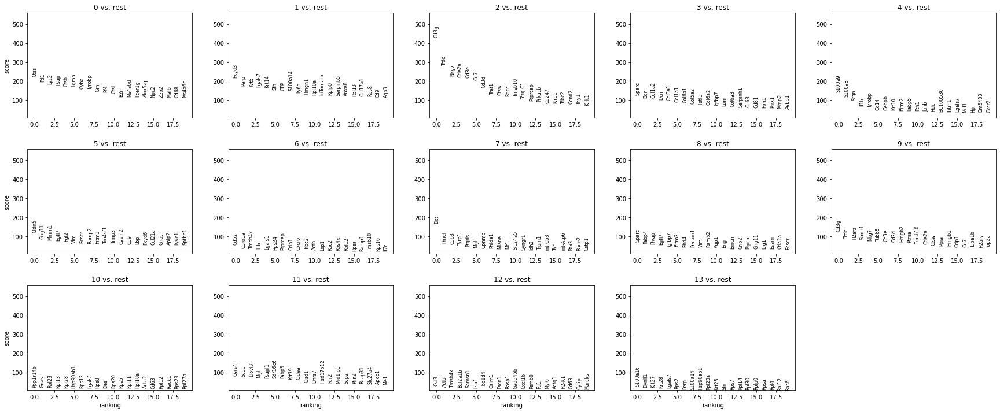

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Ctss,Fxyd3,Cd3g,Sparc,S100a9,Cldn5,Cd52,Dct,Sparc,Cd3g,Ppp1r14b,Cers4,Cst3,S100a16
1,Ftl1,Perp,Trdc,Bgn,S100a8,Gng11,Coro1a,Pmel,Fabp4,Trdc,Gnas,Scd1,Actb,Dynll1
2,Lyz2,Krt5,Nkg7,Col1a2,Srgn,Mmrn1,Tmsb4x,Cd63,Plvap,H2afz,Rpl23,Elovl3,Tmsb4x,Krt27
3,Psap,Lgals7,Ctla2a,Dcn,Il1b,Egfl7,Ltb,Tyrp1,Egfl7,Stmn1,Rpl13,Mgll,Bcl2a1b,Krt28
4,Ctsb,Krt14,Cd3e,Col3a1,Tyrobp,Fgl2,Lgals1,Ptgds,Igfbp7,Nkg7,Rpl28,Psapl1,Samsn1,Lgals7
5,Lgmn,Sfn,Cd7,Col1a1,Cd14,Vim,Rps24,Mgll,Ifitm3,Tubb5,Hsp90ab1,Sdr16c6,Lsp1,Rps2
6,Cyba,GFP,Cd3d,Col6a1,Cebpb,Ecscr,Ptprcap,Gpnmb,Ehd4,Cd3e,Rps13,Fabp5,Tbc1d4,Perp
7,Tyrobp,S100a14,Trat1,Col5a2,Krt10,Ramp2,Crip1,Phlda1,Pecam1,Cd3d,Lgals1,Krt79,Calm1,S100a14
8,Grn,Ly6d,Ctsw,Fstl1,Ifitm2,Ifitm3,Cxcr6,Mlana,Vim,Hmgb2,Rps8,Cidea,Fscn1,Hsp90ab1
9,Pf4,Hmgn1,Rgcc,Col6a2,Fabp5,Tm4sf1,Trbc2,Mt1,Ramp2,Ptma,Des,Cisd1,Basp1,Rpl23a


In [32]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden')
sc.pl.rank_genes_groups(adata, ncols = 5)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

In [33]:
leiden_named = {'0': 'IMM 1',
                '1': 'Mixed?',
                '2': 'NK',
                '3': 'FIB',
                '4': 'IMM 2',
                '5': 'Lymph',
                '6': 'IMM 3?',
                '7': 'MEL',
                '8': 'EC',
                '9': 'IMM 4',
                '10': 'vSM?',
                '11': '???',
                '12': 'IMM',
                '13': '??'
                }

adata.obs['leiden_named'] = adata.obs['leiden'].apply(lambda x: leiden_named[x])

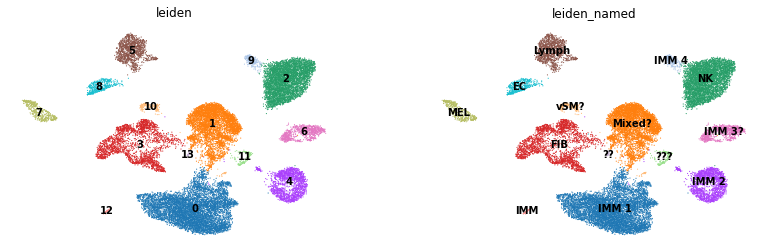

In [34]:
sc.pl.umap(adata, color = ['leiden', 'leiden_named'], legend_loc='on data', frameon = False)

# Subset Fibros

In [35]:
fib_data = adata[adata.obs['leiden_named'].isin(['FIB', 'Mixed?'])].copy()

In [36]:
sc.pp.pca(fib_data)
#sce.pp.harmony_integrate(fib_data, key = 'batch') #Harmony gave a value error that operands couldn't be broadcast together
#sc.pp.neighbors(fib_data, use_rep='X_pca_harmony')
#bbknn.bbknn(fib_data, batch_key='orig.ident', use_rep='X_pca_harmony')
bbknn.bbknn(fib_data, batch_key='orig.ident')
sc.tl.umap(fib_data, spread = 1)

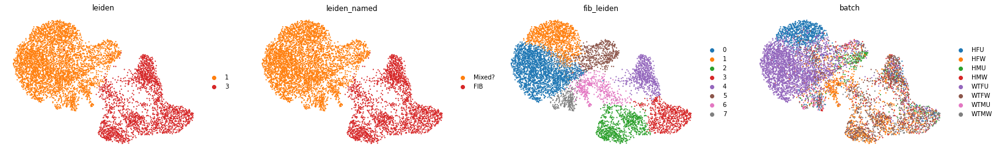

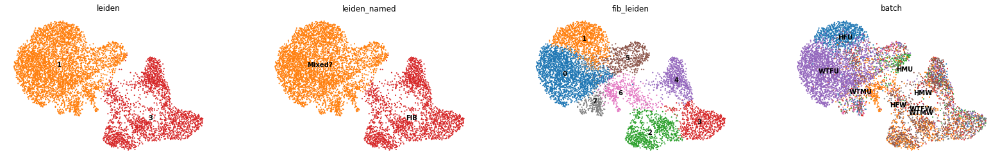

In [37]:
sc.tl.leiden(fib_data, key_added = 'fib_leiden', resolution = 0.5)
sc.pl.umap(fib_data, color = ['leiden', 'leiden_named', 'fib_leiden', 'batch'], frameon = False)
sc.pl.umap(fib_data, color = ['leiden', 'leiden_named', 'fib_leiden', 'batch'], legend_loc='on data', frameon = False)

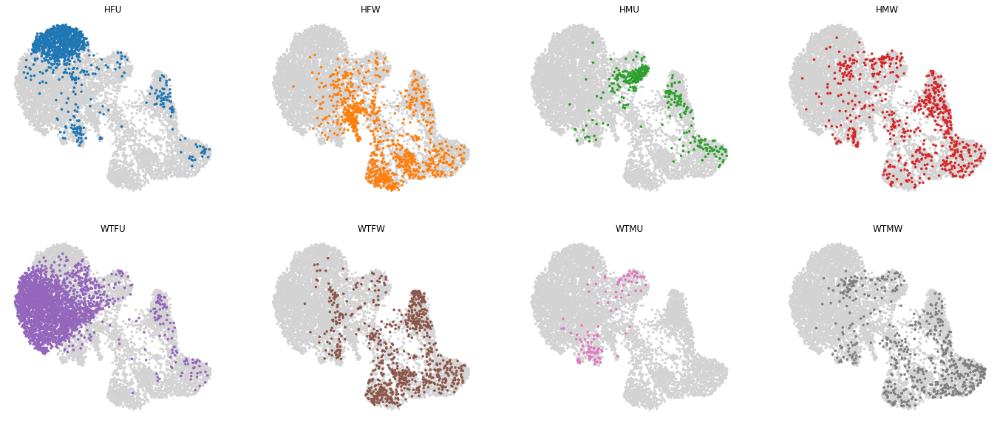

In [38]:
groups = fib_data.obs['batch'].unique()
ncols = 4
fig, axes = initialize_subplots(len(groups), ncols = ncols, figsize_multiplier=(6,5))

for ix, g in enumerate(sorted(groups)):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(fib_data, color = 'batch', ax = ax, show = False, frameon = False, groups = [g], legend_loc = 'on_data', title = g, s = 50)
clear_output()

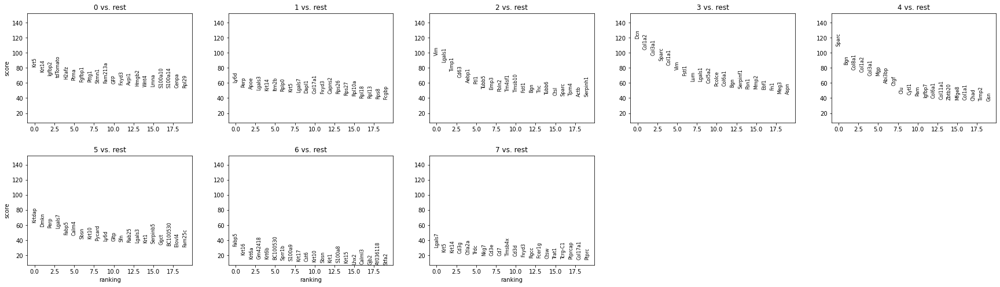

,0,1,2,3,4,5,6,7
0,Krt5,Ly6d,Vim,Dcn,Sparc,Krtdap,Fabp5,Lgals7
1,Krt14,Perp,Lgals1,Col1a2,Bgn,Dmkn,Krt16,Krt5
2,Igfbp2,Apoe,Timp1,Col3a1,Col8a1,Perp,Krt6a,Krt14
3,tdTomato,Lgals3,Cd63,Sparc,Col1a2,Lgals7,Gm42418,Cd3g
4,H2afz,Krt14,Aebp1,Col1a1,Col3a1,Fabp5,Krt6b,Ctla2a
5,Ptma,Itm2b,Ftl1,Vim,Mgp,Calm4,BC100530,Trdc
6,Fgfbp1,Rplp0,Tubb5,Fstl1,Abi3bp,Sbsn,Sprr1b,Nkg7
7,Pttg1,Krt5,Emp3,Lum,Ctgf,Krt10,S100a9,Cd3e
8,Stmn1,Lgals7,Fbln2,Lgals1,Clu,Pycard,Krt17,Cd7
9,Fam213a,Dapl1,Tm4sf1,Col5a2,Cytl1,Ly6d,Cst6,Tmsb4x


In [39]:
sc.tl.rank_genes_groups(fib_data, groupby = 'fib_leiden')
sc.pl.rank_genes_groups(fib_data, ncols = 5)
pd.DataFrame(fib_data.uns['rank_genes_groups']['names']).head(20)

## Fib subset 2

In [40]:
fib_data2 = fib_data[fib_data.obs['fib_leiden'].isin(['2', '3', '4'])].copy()

In [41]:
sc.tl.score_genes_cell_cycle(fib_data2, s_genes=s_genes, g2m_genes=g2m_genes)

/home/karlan/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/home/karlan/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [42]:
sc.pp.pca(fib_data2)
bbknn.bbknn(fib_data2, batch_key='orig.ident')
sc.tl.umap(fib_data2, spread = 1)

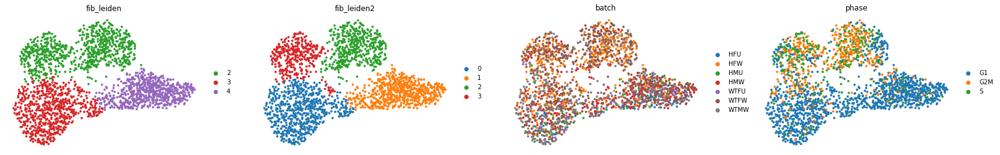

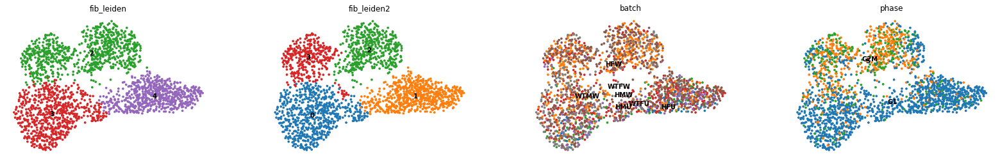

In [43]:
sc.tl.leiden(fib_data2, key_added = 'fib_leiden2', resolution = 0.5)
sc.pl.umap(fib_data2, color = ['fib_leiden', 'fib_leiden2', 'batch', 'phase'], frameon = False, ncols = 4)
sc.pl.umap(fib_data2, color = ['fib_leiden', 'fib_leiden2', 'batch', 'phase'], legend_loc='on data', frameon = False, ncols = 4)

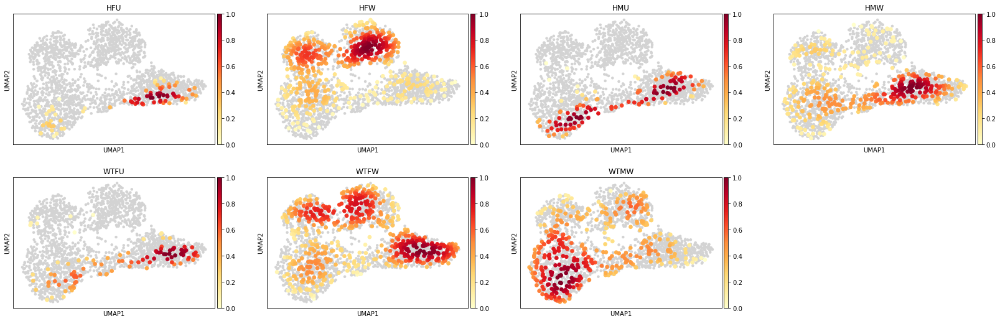

In [44]:
sc.tl.embedding_density(fib_data2,groupby = 'batch')
sc.pl.embedding_density(fib_data2, key = 'umap_density_batch')

#### Sample distribution to clusters

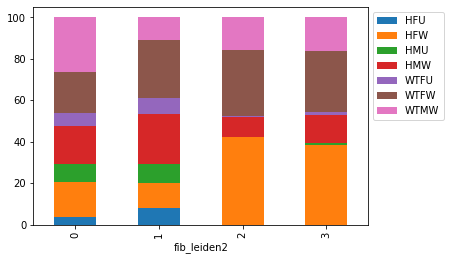

In [45]:
samp_dist = pd.DataFrame(fib_data2.obs.groupby('fib_leiden2')['batch'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

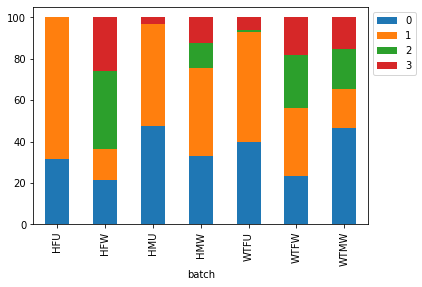

In [46]:
samp_dist = pd.DataFrame(fib_data2.obs.groupby('batch')['fib_leiden2'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

#### Sample distribuition according to cell cycle

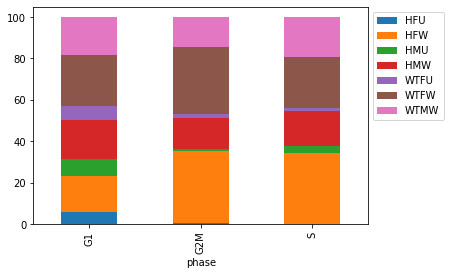

In [47]:
samp_dist = pd.DataFrame(fib_data2.obs.groupby('phase')['batch'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

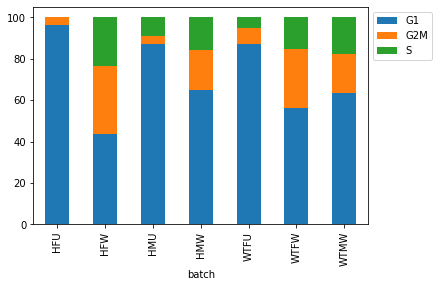

In [48]:
samp_dist = pd.DataFrame(fib_data2.obs.groupby('batch')['phase'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

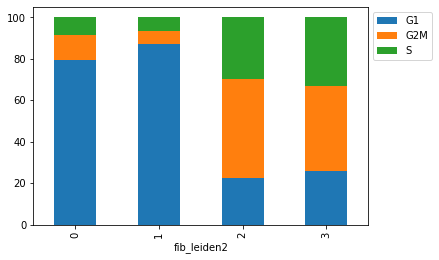

In [49]:
samp_dist = pd.DataFrame(fib_data2.obs.groupby('fib_leiden2')['phase'].value_counts(normalize = True)*100).unstack()
samp_dist.columns = samp_dist.columns.droplevel(0)
ax = samp_dist.plot(kind = 'bar', stacked=True)
ax.legend(bbox_to_anchor = (1,1))

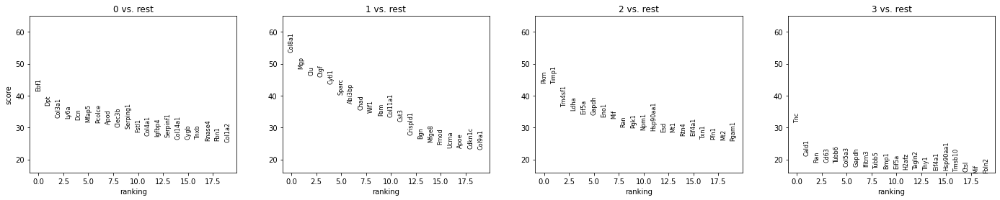

,0,1,2,3
0,Ebf1,Col8a1,Pkm,Tnc
1,Dpt,Mgp,Timp1,Cald1
2,Col3a1,Clu,Tm4sf1,Ran
3,Ly6a,Ctgf,Ldha,Cd63
4,Dcn,Cytl1,Eif5a,Tubb6
5,Mfap5,Sparc,Gapdh,Col5a3
6,Pcolce,Abi3bp,Eno1,Gapdh
7,Apod,Chad,Mif,Ifitm3
8,Clec3b,Wif1,Ran,Tubb5
9,Serping1,Pam,Pgk1,Bmp1


In [46]:
sc.tl.rank_genes_groups(fib_data2, groupby = 'fib_leiden2')
sc.pl.rank_genes_groups(fib_data2, ncols = 5)
pd.DataFrame(fib_data2.uns['rank_genes_groups']['names']).head(20)

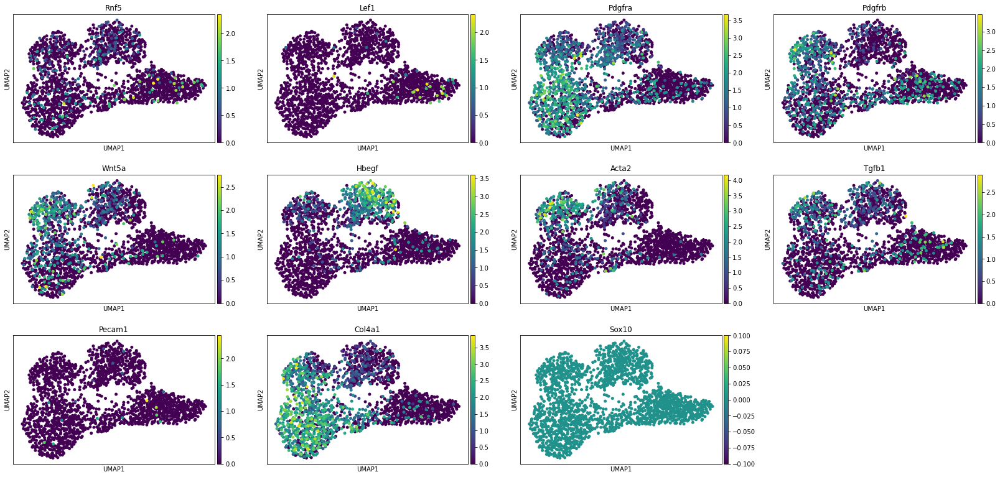

In [64]:
sc.pl.umap(fib_data2, color = ['Rnf5', 'Lef1', 'Pdgfra', 'Pdgfrb', 'Wnt5a', 'Hbegf', 'Acta2', 'Tgfb1', 'Pecam1','Col4a1','Sox10'], s = 100)

# Save fibro data

### Read files

In [5]:
path = '/mnt/c/Users/karla/OneDrive/OneDrive - Karolinska Institutet/Data/Papers/Greco/Sara/Loom files'
fib_data2 = sc.read_loom(os.path.join(path, 'Fibroblast_Only_subclustering.loom'))
fib_data2.raw = sc.read_loom(os.path.join(path, 'Fibroblast_Only_subclustering_RAW.loom'))

In [80]:
fig_path = '/mnt/c/Users/karla/OneDrive/OneDrive - Karolinska Institutet/Data/Papers/Greco/Sara/Figures'

In [109]:
sample = {'HMU': 'HMU',
          'HM5U': 'HMU', 
          'HM12U': 'HMU',
          'HM5W': 'HMW',
          'HM12W': 'HMW', 
          'HMW': 'HMW', 
          'WTM3U': 'WTMU', 
          'WTM11U': 'WTMU', 
          'WTM13U': 'WTMU',
          'WTMW3W': 'WTMW', 
          'WTMW11W': 'WTMW', 
          'WTMW13W': 'WTMW',
          'HF2W': 'HFW',
          'HF12W': 'HFW',
          'HF13W': 'HFW',
          'HFU': 'HFU',
          'HF12U': 'HFU',
          'WTFU': 'WTFU',
          'WTF6U': 'WTFU',
          'WTF8U': 'WTFU',
          'WTFW': 'WTFW',
          'WTF6W': 'WTFW',
          'WTF8W': 'WTFW'}
fib_data2.obs['batch'] = fib_data2.obs['orig.ident'].map(sample)

replicate = {'HMU': 'Mouse1',
             'HM5U': 'Mouse2', 
             'HM12U': 'Mouse3',
             'HMW': 'Mouse1',
             'HM5W': 'Mouse2', 
             'HM12W': 'Mouse3', 
             'WTM3U': 'Mouse1', 
             'WTM11U': 'Mouse2', 
             'WTM13U': 'Mouse3',
             'WTMW3W': 'Mouse1', 
             'WTMW11W': 'Mouse2', 
             'WTMW13W': 'Mouse3',
             'HF2W': 'Mouse1',
             'HF12W': 'Mouse2',
             'HF13W': 'Mouse3',
             'HFU': 'Mouse1',
             'HF12U': 'Mouse2',
             'WTFU': 'Mouse1',
             'WTF6U': 'Mouse2',
             'WTF8U': 'Mouse3',
             'WTFW': 'Mouse1',
             'WTF6W': 'Mouse2',
             'WTF8W': 'Mouse3'}
fib_data2.obs['Replicate'] = fib_data2.obs['orig.ident'].map(replicate)

In [141]:
fib_data2.obs['Sample_hras'] = ['Full' if 'F' in b else 'Mosaic' for b in fib_data2.obs['batch']]

# Figure plots

In [106]:
leiden_named = {'0': 'Homeostatic fibroblast 1 (Thy1+/Fap+)',
                '1': 'Homeostatic fibroblast 2 (Thy1-/Fap+)',
                '2': 'Injury fibroblast 1 (EGFR ligand enriched)',
                '3': 'Injury fibroblast 2 (Acta2+)'}
fib_data2.obs['leiden_named'] = fib_data2.obs['fib_leiden2'].apply(lambda x: leiden_named[x])

In [107]:
#fib_data2.obs['leiden_named'].cat.categories = ['Papillary dermis', 'Reticular dermis', 'Contractile', 'EGFR ligand fibro', ]
fib_data2.uns['leiden_named_colors'] = sbn.color_palette('tab10', n_colors = 4)

## Fig S6a

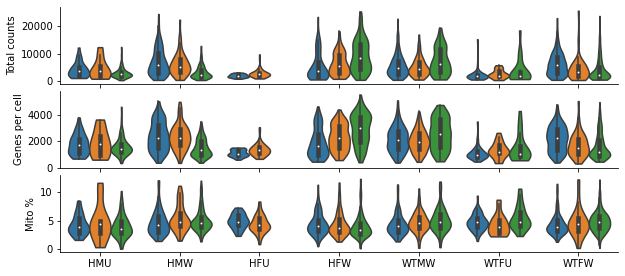

In [110]:
rename = {'nCount_RNA': 'Total counts', 
          'nFeature_RNA': 'Genes per cell', 
          'percent.mt': 'Mito %'}

plots = ['nCount_RNA', 'nFeature_RNA', 'percent.mt']
ncols = 1
fig, axes = initialize_subplots(len(plots), ncols = ncols, figsize_multiplier = (10, 1.5), sharex = True, print_help=False, gridspec_kw = {'hspace': 0.1})

for ix, y in enumerate(plots):
    ax = get_ax(axes, ix, ncols)
    sbn.violinplot(data = fib_data2.obs, x = 'batch', y = y, hue = 'Replicate', inner = 'box', ax = ax, cut = 0, scale = 'width')
    handles, labels = ax.get_legend_handles_labels()
    #sbn.stripplot(data = fib_data2.obs, x = 'batch', y = y, hue = 'Replicate', ax = ax, dodge = 0.25, color = 'k', s = 0.3)
    if y == 'nCount_RNA':
        #ax.legend(handles = handles, labels = labels, bbox_to_anchor = (1.4,1), frameon = False)
        ax.legend('', frameon = False)
        #ax.set_yticks([0, 5000, 10000, 20000])
    else:
        ax.legend('', frameon = False)
        ax.set_ylim(bottom = -0.5)
        ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins = 3, min_n_ticks = 2))
        
    
    [ax.spines[spine].set_visible(False) for spine in ['top','right']]
    ax.set_ylabel(rename[y])
    ax.set_xlabel('')
#[fig.savefig(os.path.join(fig_path, f'FIB_QC_replicates.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

## Fig S6b

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

Text(0.5, 1.0, '')

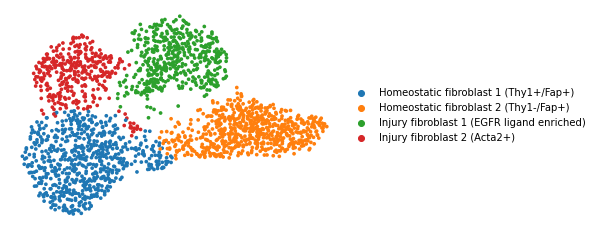

In [108]:
fig, ax = plt.subplots()
sc.pl.umap(fib_data2, color = 'leiden_named', ax = ax, frameon = False, show = False)
ax.set_title('')
#fig.savefig(os.path.join(fig_path, 'FIB_UMAP_Clustering.pdf'), bbox_inches = 'tight')

## Fig S6c

ax = axes[ix // ncols, ix % ncols]


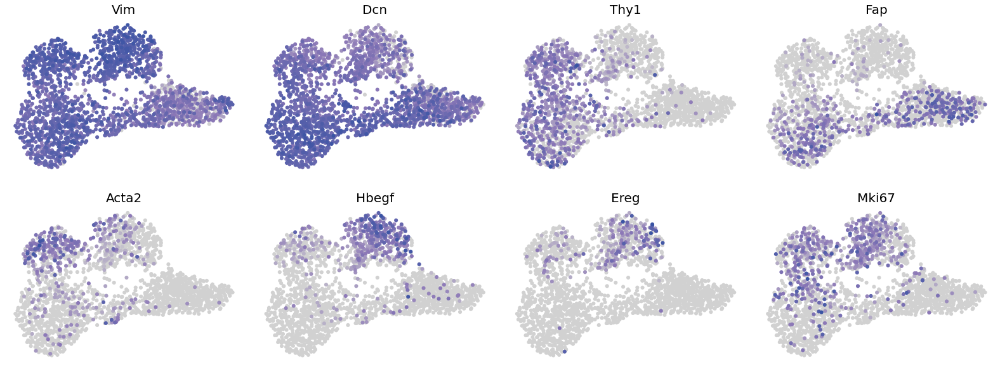

In [129]:
genes = ['Vim','Dcn','Thy1','Fap','Acta2','Hbegf','Ereg', 'Mki67']

norm = mpl.colors.Normalize(-1,1)
colors = [[norm(-1.0), "#D1D1D1"],
          [norm(0), "#8C78B7"],
          [norm( 1.0), "#3953A4"]]

cmap = mpl.colors.LinearSegmentedColormap.from_list("", colors)

s = 150
ncols = 4
fig, axes = initialize_subplots(len(genes), ncols = ncols, gridspec_kw = {'wspace':0.05}, figsize_multiplier = (7,5))

for ix, g in enumerate(genes):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(fib_data2, color = g, show = False, ax = ax, frameon = False, cmap = cmap, s = s)
    ax.collections[-1].colorbar.remove()
    ax.set_title(g, fontsize = 20)
#fig.savefig(os.path.join(fig_path, f'FIB_UMAP_Genes_{"_".join(genes)}.pdf'), bbox_inches = 'tight')

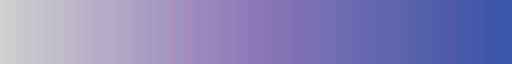

In [131]:
cmap

## Fig S6d

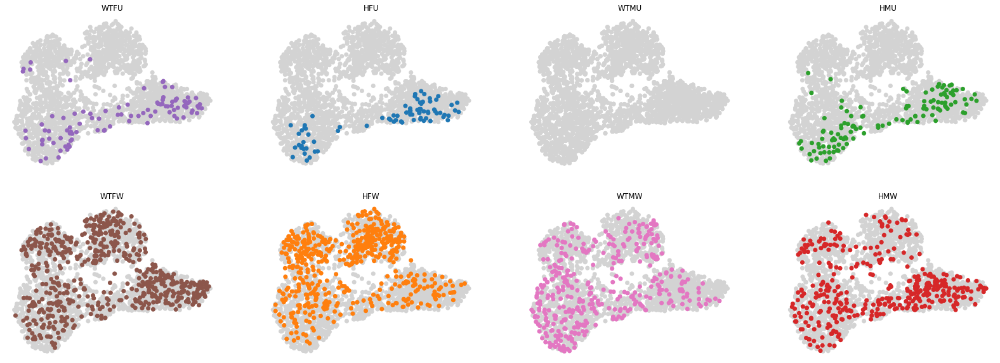

In [103]:
groups = ['WTFU', 'HFU', 'WTMU', 'HMU', 'WTFW', 'HFW', 'WTMW', 'HMW']
ncols = 4
fig, axes = initialize_subplots(len(groups), ncols = ncols)

for ix, g in enumerate(groups):
    ax = get_ax(axes, ix, ncols)
    sc.pl.umap(fib_data2, color = 'batch', groups = g, show = False, ax = ax, frameon = False, legend_loc = '', s = 200)
    if g == 'WTMU':
        sc.pl.umap(fib_data2, show = False, frameon = False, ax = ax, s = 200)
    ax.set_title(g)
        
clear_output()
clean_subplots(ix, axes, ncols)
#fig.savefig(os.path.join(fig_path, 'FIB_UMAP_Batches.pdf'), bbox_inches = 'tight')

## Fig S6e

Text(0.5, 1.0, '')

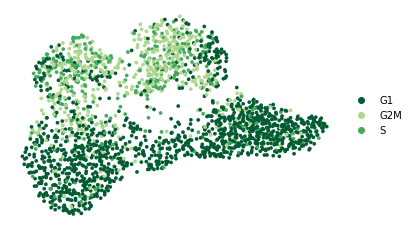

In [83]:
cmap = {'G1': '#025B32',
        'S': '#42AB5D', 
        'G2M': '#B0D78E'}
fig, ax = plt.subplots()
sc.pl.umap(fib_data2, color = 'phase', ax = ax, frameon = False, show = False, palette = cmap)
ax.set_title('')
#fig.savefig(os.path.join(fig_path, 'FIB_UMAP_Phase.pdf'), bbox_inches = 'tight')

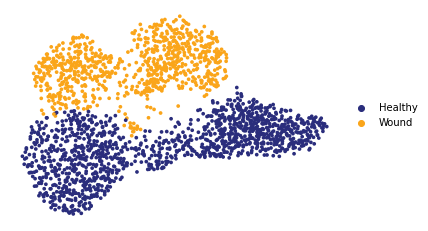

In [10]:
cmap = {'Healthy': '#2A2D7C',
        'Wound': '#FAA51A'}
fig, ax = plt.subplots()
sc.pl.umap(fib_data2, color = 'wound', ax = ax, frameon = False, show = False, palette = cmap)
ax.set_title('')
fig.savefig(os.path.join(fig_path, 'FIB_UMAP_Wound_v2.pdf'), bbox_inches = 'tight')

## Fig S6f

In [124]:
sc.tl.rank_genes_groups(fib_data2, groupby = 'leiden_named', use_raw = True, method = 'logreg')
df = pd.DataFrame(fib_data2.uns['rank_genes_groups']['names'])
df = df.head(10).to_dict(orient = 'list')
#df = {rename[k]: list(v.values()) for k,v in df.items()}
df['Homeostatic fibroblast 1 (Thy1+/Fap+)'] = ['Ebf1',
  'Thbs4',
  'Apod',
  'Dpt',
  'Igfbp4',
  'Mfap5',
  'Sfrp2',
  'Cxcl14',
  'Gas6',
  'Fap']

/home/karlan/miniconda3/envs/scanpy/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


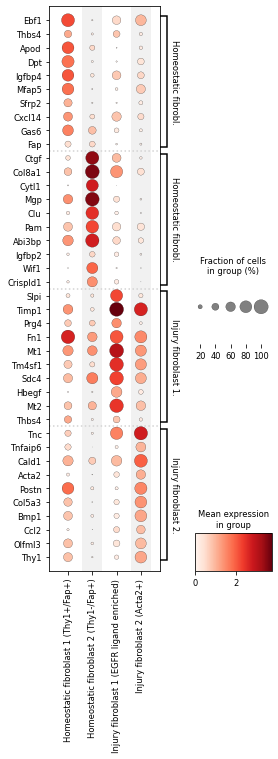

In [125]:
#sc.pl.heatmap(fib_data2, var_names = df.head(50).T.values.flatten(), groupby = 'fib_leiden2', use_raw = True)
fig = sc.pl.dotplot(fib_data2, var_names = df, groupby = 'leiden_named', use_raw = True, swap_axes = True, figsize = (4, 10), return_fig = True)
ax = fig.get_axes()['mainplot_ax']
[ax.axhline(x, ls = ':', c = 'lightgray', zorder = -1) for x in range(10, 40, 10)]
[ax.axvline(x, lw = 20, c = 'lightgray', zorder = -10, alpha = 0.3) for x in [1.5, 3.5]]
fig = plt.gcf()
#[fig.savefig(os.path.join(fig_path, f'FIB_Dotplot_Marker_genes.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

## Fig S6g

Wound Vs healthy

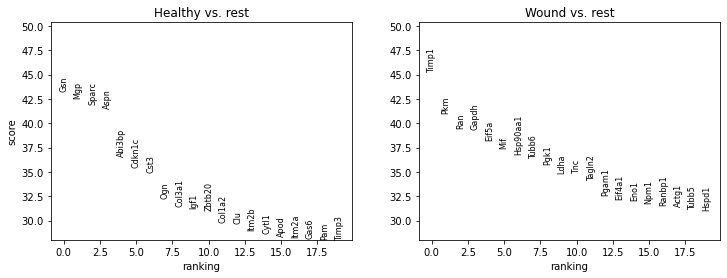

,Healthy,Wound
0,Gsn,Timp1
1,Mgp,Pkm
2,Sparc,Ran
3,Aspn,Gapdh
4,Abi3bp,Eif5a
5,Cdkn1c,Mif
6,Cst3,Hsp90aa1
7,Ogn,Tubb6
8,Col3a1,Pgk1
9,Igf1,Ldha


In [132]:
sc.tl.rank_genes_groups(fib_data2, groupby = 'wound')
sc.pl.rank_genes_groups(fib_data2, ncols = 5)
pd.DataFrame(fib_data2.uns['rank_genes_groups']['names']).head(20)

/tmp/ipykernel_1241/2735326002.py:22: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  tmp = df.set_index('names').loc[set(genes)]


160

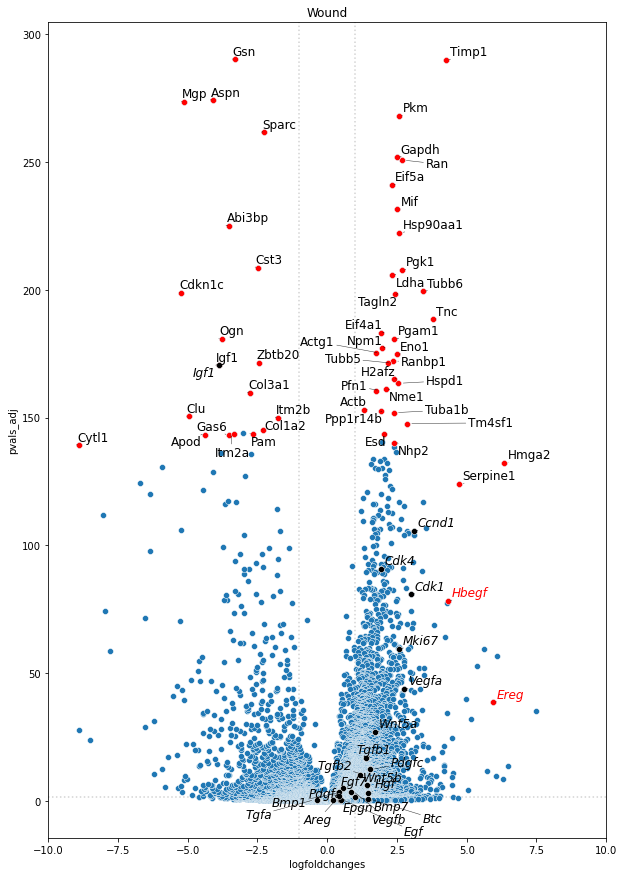

In [137]:
from adjustText import adjust_text
ligands = ['Egf', 'Areg', 'Tgfa', 'Epgn', 'Hbegf', 'Btc', 'Ereg', 'Fgf7','Wnt5a','Wnt5b','Hgf','Tgfb1','Tgfb2','Bmp1','Bmp7','Igf1']
extra_genes = ['Ccnd1', 'Cdk1', 'Cdk4', 'Mki67', 'Vegfa', 'Vegfb', 'Pdgfa', 'Pdgfc']

highlight = ['Ereg', 'Hbegf']

ligands = [x for x in ligands if x not in highlight]

xlim = [-10, 10]

fig, ax = plt.subplots(figsize = (10, 15))

df = sc.get.rank_genes_groups_df(fib_data2, group = 'Wound')
df['pvals_adj'] = -df['pvals_adj'].apply(np.log10)
df['pvals_adj'] = df['pvals_adj'].replace(np.inf, 350)
sbn.scatterplot(data = df, x = 'logfoldchanges', y = 'pvals_adj', ax = ax)
[ax.axvline(x, ls = ':', c = 'lightgray', zorder = -3) for x in [-1, 1]]
ax.axhline(-np.log10(0.05), ls = ':', c = 'lightgray', zorder = -3)
ax.set_title('Wound')

genes = list(df.set_index('names')['scores'].apply(abs).sort_values(ascending = False).index)[:50]
tmp = df.set_index('names').loc[set(genes)]
sbn.scatterplot(data = tmp, x = 'logfoldchanges', y = 'pvals_adj', ax = ax, color = 'red')
texts = [ax.text(x = x+np.sign(x)*0.1, y = y+0.1, s = n, zorder = 5, fontsize = 12) for (x, y, n) in tmp.reset_index()[['logfoldchanges', 'pvals_adj', 'names']].values 
         if x>xlim[0] and x<xlim[1]]


tmp = df.set_index('names').loc[ligands]
sbn.scatterplot(data = tmp, x = 'logfoldchanges', y = 'pvals_adj', ax = ax, color = 'k')
texts.extend([ax.text(x = x+np.sign(x)*0.1, y = y+0.1, s = n, zorder = 5, fontsize = 12, color = 'k', fontstyle = 'oblique') 
             for (x, y, n) in tmp.reset_index()[['logfoldchanges', 'pvals_adj', 'names']].values 
              if x>xlim[0] and x<xlim[1]])

tmp = df.set_index('names').loc[highlight]
sbn.scatterplot(data = tmp, x = 'logfoldchanges', y = 'pvals_adj', ax = ax, color = 'red')
texts.extend([ax.text(x = x+np.sign(x)*0.1, y = y+0.1, s = n, zorder = 5, fontsize = 12, color = 'red', fontstyle = 'oblique') 
             for (x, y, n) in tmp.reset_index()[['logfoldchanges', 'pvals_adj', 'names']].values 
              if x>xlim[0] and x<xlim[1]])

tmp = df.set_index('names').loc[extra_genes]
sbn.scatterplot(data = tmp, x = 'logfoldchanges', y = 'pvals_adj', ax = ax, color = 'k')
texts.extend([ax.text(x = x+np.sign(x)*0.1, y = y+0.1, s = n, zorder = 5, fontsize = 12, color = 'k', fontstyle = 'oblique') 
             for (x, y, n) in tmp.reset_index()[['logfoldchanges', 'pvals_adj', 'names']].values 
              if x>xlim[0] and x<xlim[1]])
    
ax.set_xlim(xlim)
adjust_text(texts, ax = ax, arrowprops=dict(arrowstyle="-", color='k', lw=0.5, alpha = 0.8, zorder = 0), autoalign='xy', force_text=(0.1,0.1), expand_text = (1,1))

#fig.savefig(os.path.join(fig_path, 'DEG_Volcano_plot_top-genes_ligands_highlights_Wound-vs-healthy.pdf'), bbox_to_inches = 'thight')

## Fig S6G

ax = axes[ix]


[None, None]

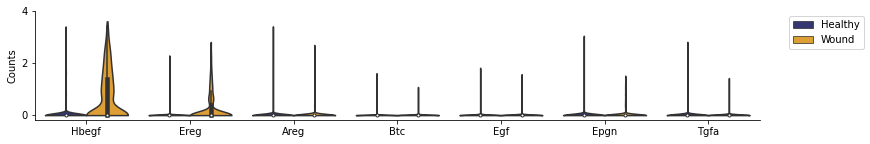

In [157]:
fontsize = 12
genes = ['Hbegf', 'Ereg', 'Areg', 'Btc', 'Egf', 'Epgn', 'Tgfa']

cmap = {'Healthy': '#2A2D7C',
        'Wound': '#FAA51A'}

comparison = 'wound'
groups = 'leiden_named'

cols = ['names','scores','pvals','pvals_adj','logfoldchanges']

fig, ax = initialize_subplots(1, ncols = 1, figsize_multiplier=(13, 2), sharex = True, gridspec_kw = {'hspace': 0.01})

newline = '\n'
df = fib_data2.obs[[comparison, groups]].copy()
df[genes] = fib_data2.raw[:, genes].X.A
df = df.melt(id_vars = comparison, value_vars=genes, var_name = 'Gene',value_name = 'Counts')

sbn.violinplot(data = df, x = 'Gene', y = 'Counts', hue = comparison, cut = 0, ax = ax, inner = 'box', palette = cmap, scale = 'width')

df['Counts'] = [x + round(np.random.uniform(-0.1, 0.1), 3) if x == 0 else x for x in df['Counts']]

ax.set_ylim(top = 4)
tick_locator = mpl.ticker.MaxNLocator(nbins=3, integer = True, min_n_ticks = 2)
ax.yaxis.set_major_locator(tick_locator)
ax.set_xlabel('')
ax.legend(bbox_to_anchor = (1.15,1))
[ax.spines[spine].set_visible(False) for spine in ['top', 'right']]

#[fig.savefig(os.path.join(fig_path, f'FIB_Violinplot_Combined_Ligands_boxplot.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

### p-values

In [158]:
df_ = fib_data2.obs.copy()
df_[genes] = fib_data2.raw[:, genes].X.A

res = {}
for g in genes:
    df = df_.groupby(['wound', 'orig.ident'])[g].mean()
    df = df.reset_index().pivot(index = 'wound', columns = 'orig.ident')
    df.columns = df.columns.droplevel(0)
    w = df[['HF2W', 'HF12W', 'HF13W', 'HM5W', 'HM12W', 'HMW', 'WTF6W', 'WTF8W', 'WTFW', 'WTMW3W', 'WTMW11W', 'WTMW13W']].loc['Wound'].values
    h = df.loc['Healthy'].values
    stat, p = scipy.stats.ttest_ind(h, w)
    if p > 0.05:
        res[g] = np.round(p, decimals=3)
    else:
        res[g] = float(f'{p:.2e}')
res

{'Hbegf': 1.07e-11,
 'Ereg': 4.17e-08,
 'Areg': 0.423,
 'Btc': 0.284,
 'Egf': 0.762,
 'Epgn': 0.997,
 'Tgfa': 0.714}

### corrected p-values

In [161]:
pvals = [1.07e-11, 4.17e-8, 0.423, 0.284, 0.762, 0.997, 0.714]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[7.48999999975957e-11,
 2.5019997391665144e-07,
 0.889158280959,
 0.811823619175424,
 0.976606344,
 0.997,
 0.976606344]

## Fig S6h

ax = axes[ix]


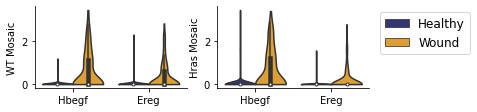

In [159]:
fontsize = 12
genes = ['Hbegf','Ereg']

cmap = {'Healthy': '#2A2D7C',
        'Wound': '#FAA51A'}

comparison = 'wound'
groups = 'leiden_named'


samples = [('WT', 'Mosaic'), ('Hras', 'Mosaic')]

fig, axes = initialize_subplots(2, ncols = 2, figsize_multiplier=(3, 1.5), sharex = True, gridspec_kw = {'hspace': 0.01})

for ix, cl in enumerate(samples):
    ax = axes[ix]
    tmp_data = fib_data2[(fib_data2.obs['sample_hras']==cl[1]) & (fib_data2.obs['sample_type'] == cl[0])]
    df = tmp_data.obs[[comparison, groups]].copy()
    df[genes] = tmp_data.raw[:, genes].X.A
    
    df = df.melt(id_vars = comparison, value_vars=genes, var_name = 'Gene',value_name = 'Counts')

    sbn.violinplot(data = df, x = 'Gene', y = 'Counts', hue = comparison, cut = 0, ax = ax, inner = 'box', palette = cmap, scale = 'width')
    handles, labels = ax.get_legend_handles_labels()
    if ix == 1:
        ax.legend(labels = labels, handles = handles, fontsize = fontsize, bbox_to_anchor = (1.7,1))
    else:
        ax.legend('', frameon = False)
    
    ax.set_xlabel('')
    ax.set_ylabel(' '.join(cl))
    
    tick_locator = mpl.ticker.MaxNLocator(nbins=3, integer = True, min_n_ticks = 2, prune = 'upper')
    ax.yaxis.set_major_locator(tick_locator)
    [ax.spines[spine].set_visible(False) for spine in ['top','right']]
#[fig.savefig(os.path.join(fig_path, f'FIB_Violinplot_Clusters_Ligands_{"_".join(genes)}.{f}'), bbox_inches = 'tight') for f in ['pdf', 'png']]

### p-values

In [168]:
cl = ('WT', 'Mosaic')
comparison = 'wound'
groups = 'leiden_named'
tmp_data = fib_data2[(fib_data2.obs['sample_hras']==cl[1]) & (fib_data2.obs['sample_type'] == cl[0])]
df_ = tmp_data.obs.copy()
df_[genes] = tmp_data.raw[:, genes].X.A

res = {}
for g in genes:
    df = df_.groupby(['wound', 'orig.ident'])[g].mean()
    df = df.reset_index().pivot(index = 'wound', columns = 'orig.ident')
    df.columns = df.columns.droplevel(0)
    w = df.loc['Wound'].values
    h = df.loc['Healthy'].values
    stat, p = scipy.stats.ttest_ind(h, w)
    if p > 0.05:
        res[g] = np.round(p, decimals=4)
    else:
        res[g] = float(f'{p:.2e}')
    print(g)
    print(df)
print(cl)
print(res)

Hbegf
orig.ident    WTMW3W   WTMW11W   WTMW13W
wound                                   
Healthy     0.020023  0.031468  0.032486
Wound       0.642187  0.801262  0.484541
Ereg
orig.ident    WTMW3W   WTMW11W   WTMW13W
wound                                   
Healthy     0.029885  0.000000  0.000000
Wound       0.453881  0.254584  0.182951
('WT', 'Mosaic')
{'Hbegf': 0.00256, 'Ereg': 0.0245}


In [170]:
cl = ('Hras', 'Mosaic')
comparison = 'wound'
groups = 'leiden_named'
tmp_data = fib_data2[(fib_data2.obs['sample_hras']==cl[1]) & (fib_data2.obs['sample_type'] == cl[0])]
df_ = tmp_data.obs.copy()
df_[genes] = tmp_data.raw[:, genes].X.A

res = {}
for g in genes:
    df = df_.groupby(['wound', 'orig.ident'])[g].mean()
    df = df.reset_index().pivot(index = 'wound', columns = 'orig.ident')
    df.columns = df.columns.droplevel(0)
    w = df[['HM5W','HM12W','HMW']].loc['Wound'].values
    h = df.loc['Healthy'].values
    stat, p = scipy.stats.ttest_ind(h, w)
    if p > 0.05:
        res[g] = np.round(p, decimals=4)
    else:
        res[g] = float(f'{p:.2e}')
print(cl)
print(res)
df

('Hras', 'Mosaic')
{'Hbegf': 0.00143, 'Ereg': 0.0032}


orig.ident,HM5U,HM5W,HM12U,HM12W,HMU,HMW
wound,,,,,,
Healthy,0.0,0.000000,0.0,0.009728,0.0,0.000000
Wound,0.0,0.355025,0.0,0.102170,0.0,0.188112


### corrected p-values

In [169]:
pvals = [0.0026, 0.025]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.00519324, 0.025]

In [171]:
pvals = [0.0014, 0.0032]
adj_pvals = sm.stats.multitest.multipletests(pvals, alpha = 0.05)[1]
[float(x) for x in adj_pvals]

[0.0027980400000000003, 0.0032]

## Fig 5

### EGFR ligand score 

In [9]:
genes = ['Hbegf', 'Ereg', 'Areg', 'Btc', 'Egf', 'Epgn', 'Tgfa']
sc.tl.score_genes(fib_data2, genes, score_name = 'Egfr_score')

/home/karlan/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


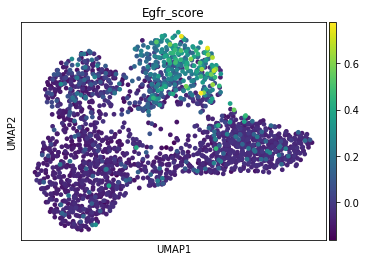

In [10]:
sc.pl.umap(fib_data2, color = 'Egfr_score', s= 90)

In [11]:
ras_map = {'HMW': 'Hras', 'HMU': 'Hras', 'WTMW': 'WT', 'WTMU': 'WT'}
fib_data2.obs['Hras'] = fib_data2.obs['batch'].map(ras_map).copy()

Text(0.5, 1.0, 'Fibroblasts')

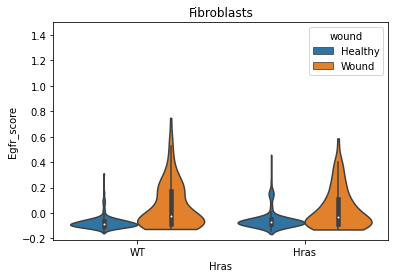

In [15]:
df = fib_data2.obs.copy()
df['Cell_type'] = 'Fibroblast'

sbn.violinplot(data = df, x = 'Hras', y = 'Egfr_score', hue = 'wound', cut = 0, scale = 'width', order = ['WT', 'Hras'])
plt.ylim(top = 1.5)
plt.title('Fibroblasts')

### Join with EPI scores

In [16]:
df_path = '/mnt/c/Users/karla/OneDrive/OneDrive - Karolinska Institutet/Data/Papers/Greco/Sara/Figures/Rebuttal_11_2022'

In [17]:
epi_df = pd.read_csv(os.path.join(df_path, 'IFE_UMAP_EGFR_score.csv'), index_col = 0)
epi_df['Cell_type'] = 'Epithelial cells'
epi_df['wound'] = epi_df['Wound_comb'].copy()

/tmp/ipykernel_1379/3517357239.py:1: DtypeWarning: Columns (8,9,10) have mixed types. Specify dtype option on import or set low_memory=False.
  epi_df = pd.read_csv(os.path.join(df_path, 'IFE_UMAP_EGFR_score.csv'), index_col = 0)


In [18]:
df = pd.concat([df, epi_df], )

### Plot

ax = axes[ix]


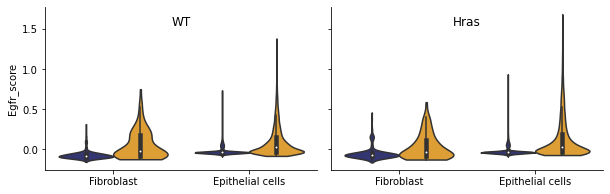

In [20]:
cmap = {'Healthy': '#2A2D7C',
        'Wound': '#FAA51A'}

ncols = 2
fig, axes = initialize_subplots(2, ncols = ncols, gridspec_kw = {'wspace': 0.05}, sharey = True, figsize_multiplier = (5, 3))

sbn.violinplot(data = df[df['Hras']=='WT'], x = 'Cell_type', y = 'Egfr_score', hue = 'wound', cut = 0, scale = 'width', hue_order = ['Healthy', 'Wound'], ax = axes[0], palette = cmap)
sbn.violinplot(data = df[df['Hras']=='Hras'], x = 'Cell_type', y = 'Egfr_score', hue = 'wound', cut = 0, scale = 'width', hue_order = ['Healthy', 'Wound'], ax = axes[1], palette = cmap)

axes[0].set_title('WT', y = 0.85)
ax = axes[1]
ax.set_ylabel('')
ax.set_title('Hras', y = 0.85)
for ax in axes:
    ax.legend('', frameon = False)
    [ax.spines[spine].set_visible(False) for spine in ['top','right']]
    ax.set_xlabel('')
    
#[fig.savefig(os.path.join(fig_path, f'EPI+FIB_Violinplot_EGFR_score_v2.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

# Make GSE barplots

In [127]:
df = pd.read_csv(os.path.join(fig_path, 'GSEA_22112022/GO_Biological_Process', 'HMU_vs_WTMU_IFE_BNC_BC_GFP+_Tom+_DEG_22112022_up-regulated.csv'), index_col = 0, decimal='.')
df['-log10(Adjusted P-value)'] = -np.log10(df['Adjusted P-value'])

ax = axes[ix]


[None, None]

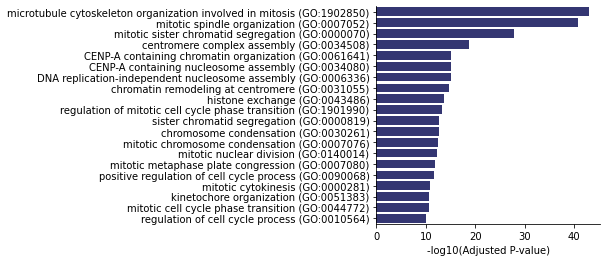

In [136]:
fig, ax = initialize_subplots(1, 1, figsize = (4, 4))
sbn.barplot(data = df.head(20), x = '-log10(Adjusted P-value)', y = 'Term', color = '#2A2D7C', ax = ax)
[ax.spines[spine].set_visible(False) for spine in ['top','right']]
ax.set_ylabel('')

[fig.savefig(os.path.join(fig_path, f'GO_terms_HMU_vs_WTMU_IFE_BNC_BC_GFP+_Tom+_DEG_22112022_up-regulated.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

In [137]:
df = pd.read_csv(os.path.join(fig_path, 'GSEA_22112022/GO_Biological_Process', 'HMW(Wound)_vs_WTMW(Wound)_IFE_BNC_BC_GFP+_Tom+_DEG_22112022_up-regulated.csv'), index_col = 0, decimal='.')
df['-log10(Adjusted P-value)'] = -np.log10(df['Adjusted P-value'])

ax = axes[ix]


[None, None]

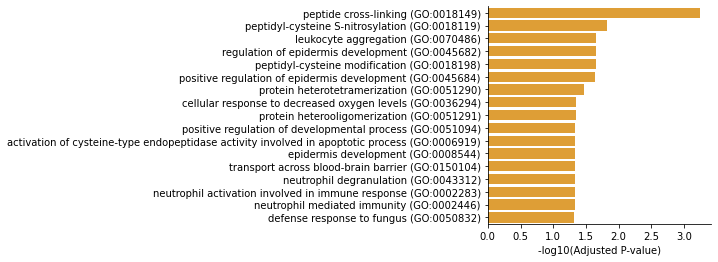

In [138]:
fig, ax = initialize_subplots(1, 1, figsize = (4, 4))
sbn.barplot(data = df.head(50)[df.head(50)['-log10(Adjusted P-value)'] >= -np.log10(0.05)], x = '-log10(Adjusted P-value)', y = 'Term', color = '#FAA51A', ax = ax)
[ax.spines[spine].set_visible(False) for spine in ['top','right']]
ax.set_ylabel('')

[fig.savefig(os.path.join(fig_path, f'GO_terms_HMW(Wound)_vs_WTMW(Wound)_IFE_BNC_BC_GFP+_Tom+_DEG_22112022_up-regulated.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]